#### The Battle of the Neighborhoods-New York City by Palani Manigundan

In [1]:
import numpy as np
import pandas as pd 
import requests
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import json 
!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim 
from pandas.io.json import json_normalize 
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from sklearn.cluster import KMeans
!conda install -c conda-forge folium=0.5.0 --yes
import folium 
print('Libraries imported.')

Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.

Libraries imported.


In [2]:
!wget -q -O 'newyork_data.json' https://cocl.us/new_york_dataset
print('Data downloaded!')

Data downloaded!


In [3]:
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)


In [4]:
newyork_data

{'type': 'FeatureCollection',
 'totalFeatures': 306,
 'features': [{'type': 'Feature',
   'id': 'nyu_2451_34572.1',
   'geometry': {'type': 'Point',
    'coordinates': [-73.84720052054902, 40.89470517661]},
   'geometry_name': 'geom',
   'properties': {'name': 'Wakefield',
    'stacked': 1,
    'annoline1': 'Wakefield',
    'annoline2': None,
    'annoline3': None,
    'annoangle': 0.0,
    'borough': 'Bronx',
    'bbox': [-73.84720052054902,
     40.89470517661,
     -73.84720052054902,
     40.89470517661]}},
  {'type': 'Feature',
   'id': 'nyu_2451_34572.2',
   'geometry': {'type': 'Point',
    'coordinates': [-73.82993910812398, 40.87429419303012]},
   'geometry_name': 'geom',
   'properties': {'name': 'Co-op City',
    'stacked': 2,
    'annoline1': 'Co-op',
    'annoline2': 'City',
    'annoline3': None,
    'annoangle': 0.0,
    'borough': 'Bronx',
    'bbox': [-73.82993910812398,
     40.87429419303012,
     -73.82993910812398,
     40.87429419303012]}},
  {'type': 'Feature',
 

In [5]:
NYC_neighborhoods_data = newyork_data['features']

In [6]:
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

NYC_neighborhoods = pd.DataFrame(columns=column_names)

In [7]:
NYC_neighborhoods

,Borough,Neighborhood,Latitude,Longitude


In [8]:
for data in  NYC_neighborhoods_data:
    borough = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    NYC_neighborhoods = NYC_neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [9]:
 NYC_neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


Visualize the borough and Neighborhood

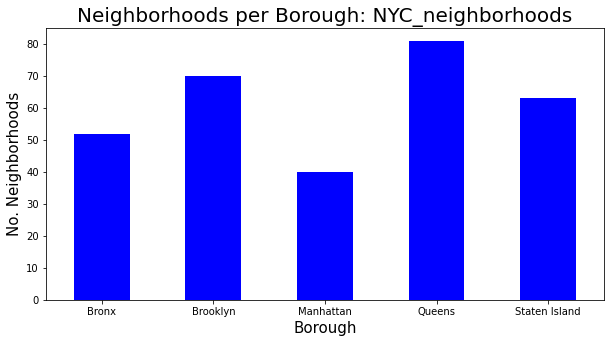

In [50]:
clr = "blue"
NYC_neighborhoods.groupby('Borough')['Neighborhood'].count().plot.bar(figsize=(10,5), color=clr)
plt.title('Neighborhoods per Borough: NYC_neighborhoods', fontsize = 20)
plt.xlabel('Borough', fontsize = 15)
plt.ylabel('No. Neighborhoods',fontsize = 15)
plt.xticks(rotation = 'horizontal')

plt.show()

In [11]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(NYC_neighborhoods['Borough'].unique()),
        NYC_neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


In [12]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [13]:
# create map of New York using latitude and longitude values
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(NYC_neighborhoods['Latitude'], NYC_neighborhoods['Longitude'], NYC_neighborhoods['Borough'], NYC_neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.9,
        parse_html=False).add_to(map_newyork)  
    
map_newyork

In [14]:
CLIENT_ID = 'ORY3JJRVXUYA0XABCEUNZQN2KUG4J1A40D2FAHXVLWGAWMRO' # your Foursquare ID
CLIENT_SECRET = 'WRZPMBFBFV5BSZ2NDNLKJUQTAHLYBVEGFMXKQ20WMQ3O4GSA' # your Foursquare Secret
VERSION = '20200605' # Foursquare API version



In [15]:
def get_venues(lat,lng):
    
    #set variables
    radius=1000
    LIMIT=100
     #url to fetch data from foursquare api
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
    
    # get all the data
    results = requests.get(url).json()
    venue_data=results["response"]['groups'][0]['items']
    venue_details=[]
    for row in venue_data:
        try:
            venue_id=row['venue']['id']
            venue_name=row['venue']['name']
            venue_category=row['venue']['categories'][0]['name']
            venue_details.append([venue_id,venue_name,venue_category])
        except KeyError:
            pass
        
    column_names=['ID','Name','Category']
    NYC_data = pd.DataFrame(venue_details,columns=column_names)
    print("done")
    return NYC_data

In [16]:
def get_venue_details(venue_id):
    #url to fetch data from foursquare api
    url = 'https://api.foursquare.com/v2/venues/{}?&client_id={}&client_secret={}&v={}'.format(
            venue_id,
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION)
    # get all the data
    results = requests.get(url).json()
    print(results)
    venue_data=results['response']['venue']
    venue_details=[]
    try:
        venue_id=venue_data['id']
        venue_name=venue_data['name']
        venue_likes=venue_data['likes']['count']
        venue_rating=venue_data['rating']
        venue_tips=venue_data['tips']['count']
        venue_details.append([venue_id,venue_name,venue_likes,venue_rating,venue_tips])
    except KeyError:
        pass
    column_names=['ID','Name','Likes','Rating','Tips']
    NYC_data = pd.DataFrame(venue_details,columns=column_names)
    return NYC_data


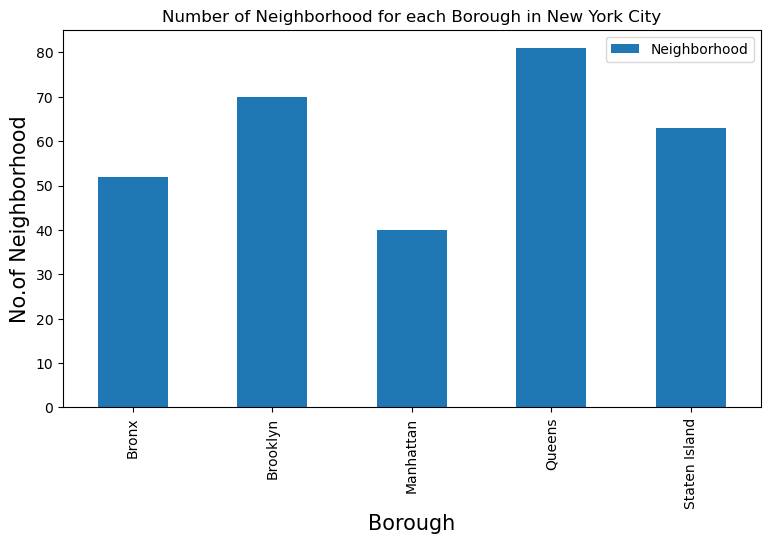

In [17]:
plt.figure(figsize=(9,5), dpi = 100)
# title
plt.title('Number of Neighborhood for each Borough in New York City')
#On x-axis
plt.xlabel('Borough', fontsize = 15)
#On y-axis
plt.ylabel('No.of Neighborhood', fontsize=15)
#giving a bar plot
NYC_neighborhoods.groupby('Borough')['Neighborhood'].count().plot(kind='bar')
#legend
plt.legend()
#displays the plot
plt.show()

In [18]:
LIMIT=100
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [19]:
column_names=['Borough', 'Neighborhood', 'ID','Name']
indian_rest =pd.DataFrame(columns=column_names)
count=1
for row in NYC_neighborhoods.values.tolist():
    Borough, Neighborhood, Latitude, Longitude=row
    venues = get_venues(Latitude,Longitude)
    indian_resturants=venues[venues['Category']=='Indian Restaurant']   
    print('(',count,'/',len(newyork_data),')','Indian Resturants in '+Neighborhood+', '+Borough+':'+str(len(indian_resturants)))
    for resturant_detail in indian_resturants.values.tolist():
        id, name , category=resturant_detail
        indian_rest = indian_rest.append({'Borough': Borough,
                                                'Neighborhood': Neighborhood, 
                                                'ID': id,
                                                'Name' : name
                                               }, ignore_index=True)
    count+=1

done
( 1 / 5 ) Indian Resturants in Wakefield, Bronx:0
done
( 2 / 5 ) Indian Resturants in Co-op City, Bronx:0
done
( 3 / 5 ) Indian Resturants in Eastchester, Bronx:0
done
( 4 / 5 ) Indian Resturants in Fieldston, Bronx:0
done
( 5 / 5 ) Indian Resturants in Riverdale, Bronx:0
done
( 6 / 5 ) Indian Resturants in Kingsbridge, Bronx:0
done
( 7 / 5 ) Indian Resturants in Marble Hill, Manhattan:0
done
( 8 / 5 ) Indian Resturants in Woodlawn, Bronx:1
done
( 9 / 5 ) Indian Resturants in Norwood, Bronx:0
done
( 10 / 5 ) Indian Resturants in Williamsbridge, Bronx:0
done
( 11 / 5 ) Indian Resturants in Baychester, Bronx:0
done
( 12 / 5 ) Indian Resturants in Pelham Parkway, Bronx:0
done
( 13 / 5 ) Indian Resturants in City Island, Bronx:0
done
( 14 / 5 ) Indian Resturants in Bedford Park, Bronx:0
done
( 15 / 5 ) Indian Resturants in University Heights, Bronx:0
done
( 16 / 5 ) Indian Resturants in Morris Heights, Bronx:0
done
( 17 / 5 ) Indian Resturants in Fordham, Bronx:0
done
( 18 / 5 ) India

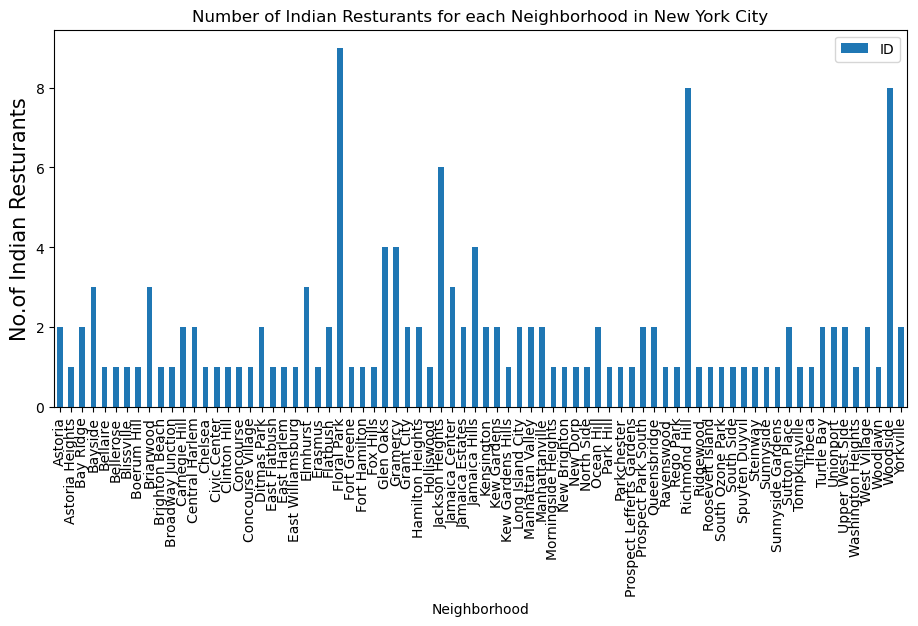

In [48]:
plt.figure(figsize=(11,5), dpi = 100)
# title
plt.title('Number of Indian Resturants for each Neighborhood in New York City')
#On x-axis
plt.xlabel('Neighborhood', fontsize = 10)
#On y-axis
plt.ylabel('No.of Indian Resturants', fontsize=15)
#giving a bar plot
indian_rest.groupby('Neighborhood')['ID'].count().plot(kind='bar')
#legend
plt.legend()
#displays the plot
plt.show()

As we see Floral Park,Richmond Hill and Woodside have the heighest number of Indian restaurants.

In [21]:
indian_rest.head()

,Borough,Neighborhood,ID,Name
0,Bronx,Woodlawn,4c0448d9310fc9b6bf1dc761,Curry Spot
1,Bronx,Parkchester,4c194631838020a13e78e561,Melanies Roti Bar And Grill
2,Bronx,Spuyten Duyvil,4c04544df423a593ac83d116,Cumin Indian Cuisine
3,Bronx,Concourse,551b7f75498e86c00a0ed2e1,Hungry Bird
4,Bronx,Unionport,4c194631838020a13e78e561,Melanies Roti Bar And Grill


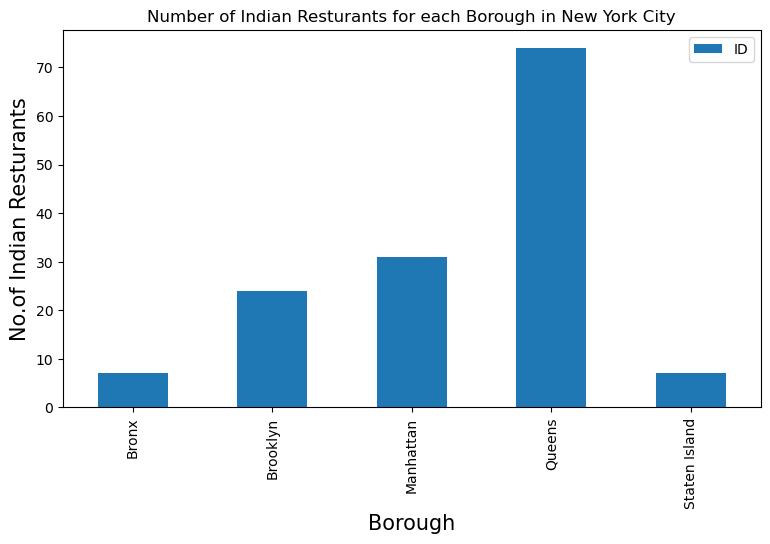

In [22]:
plt.figure(figsize=(9,5), dpi = 100)
# title
plt.title('Number of Indian Resturants for each Borough in New York City')
#On x-axis
plt.xlabel('Borough', fontsize = 15)
#On y-axis
plt.ylabel('No.of Indian Resturants', fontsize=15)
#giving a bar plot
indian_rest.groupby('Borough')['ID'].count().plot(kind='bar')
#legend
plt.legend()
#displays the plot
plt.show()

In [23]:
 NYC_venues = getNearbyVenues(names = NYC_neighborhoods['Neighborhood'], latitudes = NYC_neighborhoods['Latitude'], longitudes = NYC_neighborhoods['Longitude'])

Wakefield
Co-op City
Eastchester
Fieldston
Riverdale
Kingsbridge
Marble Hill
Woodlawn
Norwood
Williamsbridge
Baychester
Pelham Parkway
City Island
Bedford Park
University Heights
Morris Heights
Fordham
East Tremont
West Farms
High  Bridge
Melrose
Mott Haven
Port Morris
Longwood
Hunts Point
Morrisania
Soundview
Clason Point
Throgs Neck
Country Club
Parkchester
Westchester Square
Van Nest
Morris Park
Belmont
Spuyten Duyvil
North Riverdale
Pelham Bay
Schuylerville
Edgewater Park
Castle Hill
Olinville
Pelham Gardens
Concourse
Unionport
Edenwald
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker

In [24]:
print(NYC_venues.shape)
NYC_venues.head()

(10137, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy
2,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
3,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy
4,Wakefield,40.894705,-73.847201,Dunkin',40.890459,-73.849089,Donut Shop


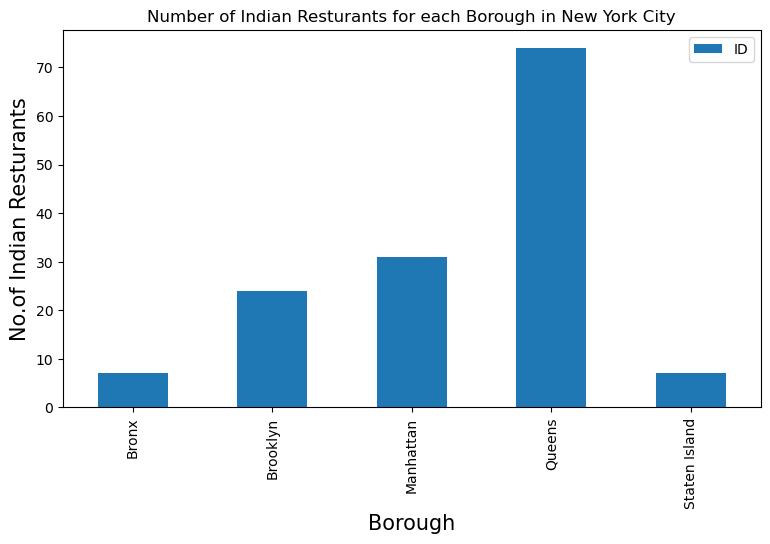

In [49]:
plt.figure(figsize=(9,5), dpi = 100)
# title
plt.title('Number of Indian Resturants for each Borough in New York City')
#On x-axis
plt.xlabel('Borough', fontsize = 15)
#On y-axis
plt.ylabel('No.of Indian Resturants', fontsize=15)
#giving a bar plot
indian_rest.groupby('Borough')['ID'].count().plot(kind='bar')
#legend
plt.legend()
#displays the plot
plt.show()

In [25]:
NYC_venues.groupby('Venue Category')['Venue'].count().sort_values(ascending=False)

Venue Category
Pizza Place                                 434
Coffee Shop                                 320
Italian Restaurant                          317
Deli / Bodega                               275
Bar                                         229
Bakery                                      224
Chinese Restaurant                          217
Grocery Store                               191
Sandwich Place                              182
Mexican Restaurant                          179
Park                                        177
Pharmacy                                    176
Café                                        169
Donut Shop                                  167
American Restaurant                         166
Bank                                        146
Ice Cream Shop                              140
Gym / Fitness Center                        123
Bagel Shop                                  115
Gym                                         115
Sushi Restaurant         

In [26]:
NYC_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Allerton,31,31,31,31,31,31
Annadale,11,11,11,11,11,11
Arden Heights,4,4,4,4,4,4
Arlington,7,7,7,7,7,7
Arrochar,21,21,21,21,21,21
Arverne,20,20,20,20,20,20
Astoria,100,100,100,100,100,100
Astoria Heights,12,12,12,12,12,12
Auburndale,20,20,20,20,20,20


In [27]:
print('There are {} uniques categories.'.format(len(NYC_venues['Venue Category'].unique())))

There are 432 uniques categories.


<a id='item3'></a>

## 3. Analyze Each Neighborhood

In [28]:
NYC_onehot = pd.get_dummies(NYC_venues[['Venue Category']], prefix="", prefix_sep="")
NYC_onehot['Neighborhood'] = NYC_venues['Neighborhood'] 
col_list =list(NYC_onehot.columns)
col_list.remove('Neighborhood')
cols=['Neighborhood'] + [col for col in col_list]

NYC_onehot = NYC_onehot[cols]

NYC_onehot.tail(10)

,Neighborhood,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Non-Profit,Noodle House,North Indi

In [29]:
NYC_onehot.shape

(10137, 432)

In [30]:
NYC_grouped = NYC_onehot.groupby('Neighborhood').mean().reset_index()
NYC_grouped

,Neighborhood,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Non-Profit,Noodle House,North Indi

In [31]:
num_top_venues = 6

for hood in NYC_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = NYC_grouped[NYC_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Allerton----
              venue  freq
0       Pizza Place  0.13
1  Department Store  0.06
2     Deli / Bodega  0.06
3            Bakery  0.06
4       Supermarket  0.06
5       Gas Station  0.03


----Annadale----
                 venue  freq
0          Pizza Place  0.18
1  American Restaurant  0.18
2         Dance Studio  0.09
3           Restaurant  0.09
4                Diner  0.09
5                 Food  0.09


----Arden Heights----
                           venue  freq
0                       Pharmacy  0.25
1                    Coffee Shop  0.25
2               Business Service  0.25
3                    Pizza Place  0.25
4  Paper / Office Supplies Store  0.00
5                      Pet Store  0.00


----Arlington----
                 venue  freq
0        Boat or Ferry  0.14
1        Deli / Bodega  0.14
2             Bus Stop  0.14
3  American Restaurant  0.14
4          Coffee Shop  0.14
5        Grocery Store  0.14


----Arrochar----
                   venue  freq
0        

In [32]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [33]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = NYC_grouped['Neighborhood']

for ind in np.arange(NYC_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(NYC_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head(20)

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Allerton,Pizza Place,Deli / Bodega,Supermarket,Department Store,Bakery,Fast Food Restaurant,Grocery Store,Mexican Restaurant,Gas Station,Breakfast Spot
1,Annadale,Pizza Place,American Restaurant,Dance Studio,Restaurant,Train Station,Diner,Cosmetics Shop,Food,Pharmacy,Factory
2,Arden Heights,Pharmacy,Coffee Shop,Business Service,Pizza Place,Yoga Studio,Filipino Restaurant,Exhibit,Eye Doctor,Factory,Falafel Restaurant
3,Arlington,Deli / Bodega,Intersection,American Restaurant,Bus Stop,Coffee Shop,Grocery Store,Boat or Ferry,Financial or Legal Service,Factory,Falafel Restaurant
4,Arrochar,Bus Stop,Italian Restaurant,Deli / Bodega,Pizza Place,Outdoors & Recreation,Bagel Shop,Liquor Store,Mediterranean Restaurant,Athletics & Sports,Supermarket
5,Arverne,Surf Spot,Sandwich Place,Metro Station,Wine Shop,Bed & Breakfast,Bus Stop,Board Shop,Beach,Café,Playground
6,Astoria,Bar,Middle Eastern Restaurant,Greek Restaurant,Hookah Bar,Mediterranean Restaurant,Seafood Restaurant,Bakery,Indian Restaurant,Deli / Bodega,Pizza Place
7,Astoria Heights,Italian Restaurant,Bowling Alley,Burger Joint,Bakery,Hostel,Pizza Place,Playground,Plaza,Laundromat,Supermarket
8,Auburndale,Italian Restaurant,Mattress Store,Pet Store,Mobile Phone Shop,Toy / Game Store,Sushi Restaurant,Comic Shop,Pharmacy,Bar,Korean Restaurant
9,Bath Beach,Pizza Place,Pharmacy,Chinese Restaurant,Fast Food Restaurant,Italian Restaurant,Bubble Tea Shop,Donut Shop,Gas Station,Sushi Restaurant,Halal Restaurant


<a id='item4'></a>

## 4. Cluster Neighborhoods

Run *k*-means to cluster the neighborhood into 5 clusters.

In [34]:
from sklearn.cluster import KMeans

kclusters = 5
NYC_grouped_clustering = NYC_grouped.drop ('Neighborhood', 1)
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(NYC_grouped_clustering)
kmeans.labels_[0:10]

array([2, 2, 2, 0, 0, 2, 2, 2, 2, 2], dtype=int32)

In [35]:

neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
NYC_merged = NYC_neighborhoods
NYC_merged = NYC_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')
NYC_merged

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bronx,Wakefield,40.894705,-73.847201,2.0,Pharmacy,Ice Cream Shop,Pizza Place,Sandwich Place,Donut Shop,Gas Station,Laundromat,Dessert Shop,Deli / Bodega,Food
1,Bronx,Co-op City,40.874294,-73.829939,2.0,Bus Station,Baseball Field,Fast Food Restaurant,Chinese Restaurant,Park,Grocery Store,Bagel Shop,Pharmacy,Pizza Place,Discount Store
2,Bronx,Eastchester,40.887556,-73.827806,2.0,Bus Station,Caribbean Restaurant,Deli / Bodega,Diner,Donut Shop,Metro Station,Chinese Restaurant,Fast Food Restaurant,Seafood Restaurant,Pizza Place
3,Bronx,Fieldston,40.895437,-73.905643,2.0,Plaza,Music Venue,River,Bus Station,Fish & Chips Shop,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market
4,Bronx,Riverdale,40.890834,-73.912585,2.0,Bus Station,Medical Supply Store,Park,Baseball Field,Food Truck,Bank,Gym,Plaza,Home Service,Field
5,Bronx,Kingsbridge,40.881687,-73.902818,2.0,Pizza Place,Bar,Mexican Restaurant,Supermarket,Latin American Restaurant,Spanish Restaurant,Bakery,Sandwich Place,Donut Shop,Fried Chicken Joint
6,Manhattan,Marble Hill,40.876551,-73.910660,2.0,Gym,Coffee Shop,Yoga Studio,Kids Store,Steakhouse,Supplement Shop,Miscellaneous Shop,Big Box Store,Shopping Mall,Tennis Stadium
7,Bronx,Woodlawn,40.898273,-73.867315,2.0,Pub,Pizza Place,Deli / Bodega,Bar,Food & Drink Shop,Playground,Train Station,Trail,Plaza,Pharmacy
8,Bronx,Norwood,40.877224,-73.879391,2.0,Pizza Place,Park,Bank,Pharmacy,Chinese Restaurant,Deli / Bodega,Bus Station,Spanish Restaurant,Supermarket,Caribbean Restaurant
9,Bronx,Williamsbridge,40.881039,-73.857446,2.0,Bar,Soup Place,Caribbean Restaurant,Nightclub,Food Truck,Food Stand,Exhibit,Eye Doctor,Factory,Falafel Restaurant


In [36]:
NYC_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306 entries, 0 to 305
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Borough                 306 non-null    object 
 1   Neighborhood            306 non-null    object 
 2   Latitude                306 non-null    float64
 3   Longitude               306 non-null    float64
 4   Cluster Labels          305 non-null    float64
 5   1st Most Common Venue   305 non-null    object 
 6   2nd Most Common Venue   305 non-null    object 
 7   3rd Most Common Venue   305 non-null    object 
 8   4th Most Common Venue   305 non-null    object 
 9   5th Most Common Venue   305 non-null    object 
 10  6th Most Common Venue   305 non-null    object 
 11  7th Most Common Venue   305 non-null    object 
 12  8th Most Common Venue   305 non-null    object 
 13  9th Most Common Venue   305 non-null    object 
 14  10th Most Common Venue  305 non-null    ob

In [37]:
NYC_merged.dropna(inplace=True)

In [38]:
NYC_merged.shape

(305, 15)

In [39]:
NYC_merged['Cluster Labels']=NYC_merged['Cluster Labels'].astype(int)

In [40]:
NYC_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 305 entries, 0 to 305
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Borough                 305 non-null    object 
 1   Neighborhood            305 non-null    object 
 2   Latitude                305 non-null    float64
 3   Longitude               305 non-null    float64
 4   Cluster Labels          305 non-null    int64  
 5   1st Most Common Venue   305 non-null    object 
 6   2nd Most Common Venue   305 non-null    object 
 7   3rd Most Common Venue   305 non-null    object 
 8   4th Most Common Venue   305 non-null    object 
 9   5th Most Common Venue   305 non-null    object 
 10  6th Most Common Venue   305 non-null    object 
 11  7th Most Common Venue   305 non-null    object 
 12  8th Most Common Venue   305 non-null    object 
 13  9th Most Common Venue   305 non-null    object 
 14  10th Most Common Venue  305 non-null    ob

Finally, let's visualize the resulting clusters

In [41]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(NYC_merged['Latitude'], NYC_merged['Longitude'], NYC_merged['Neighborhood'], NYC_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

<a id='item5'></a>

## Examine Clusters

Now,we can examine each cluster and determine the discriminating venue categories that distinguish each cluster.

## Cluster 1-color red

In [42]:
#Relaxing places
NYC_merged.loc[NYC_merged['Cluster Labels'] == 0]

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
172,Queens,Breezy Point,40.557401,-73.925512,0,Beach,Monument / Landmark,Trail,Bus Stop,Fish & Chips Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant
198,Staten Island,New Brighton,40.640615,-74.087017,0,Bus Stop,Deli / Bodega,Park,Discount Store,Bowling Alley,Playground,Bridal Shop,Food Court,Food Stand,Falafel Restaurant
205,Staten Island,Port Richmond,40.633669,-74.129434,0,Donut Shop,Bus Stop,Pizza Place,Rental Car Location,Food Stand,Food Court,Exhibit,Eye Doctor,Factory,Falafel Restaurant
212,Staten Island,Oakwood,40.558462,-74.121566,0,Bar,Bus Stop,Lawyer,Nightlife Spot,Food Truck,Food Stand,Exhibit,Eye Doctor,Factory,Falafel Restaurant
224,Staten Island,Park Hill,40.609190,-74.080157,0,Bus Stop,Athletics & Sports,Hotel,Coffee Shop,Gym / Fitness Center,Yoga Studio,Eye Doctor,Factory,Falafel Restaurant,Farm
227,Staten Island,Arlington,40.635325,-74.165104,0,Deli / Bodega,Intersection,American Restaurant,Bus Stop,Coffee Shop,Grocery Store,Boat or Ferry,Financial or Legal Service,Factory,Falafel Restaurant
228,Staten Island,Arrochar,40.596313,-74.067124,0,Bus Stop,Italian Restaurant,Deli / Bodega,Pizza Place,Outdoors & Recreation,Bagel Shop,Liquor Store,Mediterranean Restaurant,Athletics & Sports,Supermarket
229,Staten Island,Grasmere,40.598268,-74.076674,0,Bus Stop,Bagel Shop,Japanese Restaurant,Vegetarian / Vegan Restaurant,Restaurant,Cosmetics Shop,Pizza Place,Pharmacy,Park,Nail Salon
232,Staten Island,Midland Beach,40.573527,-74.093483,0,Beach,Bus Stop,Bookstore,Martial Arts Dojo,Pet Store,Restaurant,Food,Russian Restaurant,Liquor Store,Yoga Studio
245,Staten Island,Bloomfield,40.605779,-74.187256,0,Recreation Center,Burger Joint,Theme Park,Bus Stop,Financial or Legal Service,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market


In this cluster, we see Staten Island and Queens mainly and 1st most common venues are pizza and Deli.

## Cluster 2-Purple

In [43]:
# busy area(mix of all kinds)
NYC_merged.loc[NYC_merged['Cluster Labels'] == 1]

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
34,Bronx,Belmont,40.857277,-73.888452,1,Italian Restaurant,Pizza Place,Deli / Bodega,Bakery,Dessert Shop,Grocery Store,Bank,Donut Shop,Sandwich Place,Mexican Restaurant
39,Bronx,Edgewater Park,40.821986,-73.813885,1,Italian Restaurant,Deli / Bodega,Pizza Place,Japanese Restaurant,Asian Restaurant,Sports Bar,Spa,Fast Food Restaurant,Park,Bar
206,Staten Island,Mariner's Harbor,40.632546,-74.150085,1,Italian Restaurant,Deli / Bodega,Athletics & Sports,Supermarket,Bus Stop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant
217,Staten Island,Tottenville,40.505334,-74.246569,1,Thrift / Vintage Store,Cosmetics Shop,Bus Stop,Mexican Restaurant,Deli / Bodega,Italian Restaurant,Home Service,Exhibit,Eye Doctor,Factory
230,Staten Island,Old Town,40.596329,-74.087511,1,Italian Restaurant,Deli / Bodega,Gas Station,Mattress Store,Grocery Store,Greek Restaurant,Pharmacy,Liquor Store,Bakery,Salon / Barbershop
234,Staten Island,New Dorp Beach,40.564255,-74.104327,1,Italian Restaurant,Deli / Bodega,Restaurant,Scenic Lookout,Electronics Store,Home Service,Food,Diner,Sports Bar,Skating Rink
251,Staten Island,Richmond Town,40.569606,-74.134057,1,Italian Restaurant,Bagel Shop,Spa,Café,Fish & Chips Shop,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market
257,Staten Island,Howland Hook,40.638433,-74.186223,1,Italian Restaurant,Event Service,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field
287,Staten Island,Egbertville,40.579119,-74.127272,1,Italian Restaurant,Clothing Store,Bagel Shop,Cosmetics Shop,Financial or Legal Service,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm
292,Staten Island,Lighthouse Hill,40.576506,-74.137927,1,Café,Italian Restaurant,Trail,Spa,Art Museum,Fish & Chips Shop,Eye Doctor,Factory,Falafel Restaurant,Farm


This cluster is the biggest of all, we see the number one venue is restaurants in multiple boroughs across followed by another restaurant or family fun place.

## Cluster 3-Light Blue

In [44]:
# Mixed commercial areas
NYC_merged.loc[NYC_merged['Cluster Labels'] == 2]

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bronx,Wakefield,40.894705,-73.847201,2,Pharmacy,Ice Cream Shop,Pizza Place,Sandwich Place,Donut Shop,Gas Station,Laundromat,Dessert Shop,Deli / Bodega,Food
1,Bronx,Co-op City,40.874294,-73.829939,2,Bus Station,Baseball Field,Fast Food Restaurant,Chinese Restaurant,Park,Grocery Store,Bagel Shop,Pharmacy,Pizza Place,Discount Store
2,Bronx,Eastchester,40.887556,-73.827806,2,Bus Station,Caribbean Restaurant,Deli / Bodega,Diner,Donut Shop,Metro Station,Chinese Restaurant,Fast Food Restaurant,Seafood Restaurant,Pizza Place
3,Bronx,Fieldston,40.895437,-73.905643,2,Plaza,Music Venue,River,Bus Station,Fish & Chips Shop,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market
4,Bronx,Riverdale,40.890834,-73.912585,2,Bus Station,Medical Supply Store,Park,Baseball Field,Food Truck,Bank,Gym,Plaza,Home Service,Field
5,Bronx,Kingsbridge,40.881687,-73.902818,2,Pizza Place,Bar,Mexican Restaurant,Supermarket,Latin American Restaurant,Spanish Restaurant,Bakery,Sandwich Place,Donut Shop,Fried Chicken Joint
6,Manhattan,Marble Hill,40.876551,-73.910660,2,Gym,Coffee Shop,Yoga Studio,Kids Store,Steakhouse,Supplement Shop,Miscellaneous Shop,Big Box Store,Shopping Mall,Tennis Stadium
7,Bronx,Woodlawn,40.898273,-73.867315,2,Pub,Pizza Place,Deli / Bodega,Bar,Food & Drink Shop,Playground,Train Station,Trail,Plaza,Pharmacy
8,Bronx,Norwood,40.877224,-73.879391,2,Pizza Place,Park,Bank,Pharmacy,Chinese Restaurant,Deli / Bodega,Bus Station,Spanish Restaurant,Supermarket,Caribbean Restaurant
9,Bronx,Williamsbridge,40.881039,-73.857446,2,Bar,Soup Place,Caribbean Restaurant,Nightclub,Food Truck,Food Stand,Exhibit,Eye Doctor,Factory,Falafel Restaurant


This cluster the common location is bus stops, Deli

## Cluster 4-Light Green

In [45]:
# Relaxed/calm locations
NYC_merged.loc[NYC_merged['Cluster Labels'] == 3]

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
192,Queens,Somerville,40.597711,-73.796648,3,Park,Yoga Studio,Financial or Legal Service,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant
203,Staten Island,Todt Hill,40.597069,-74.111329,3,Park,Yoga Studio,Financial or Legal Service,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant


This cluster presents with park, yoga studios for relaxation/ sight seeing.

## Cluster 5-Light Brown

In [46]:
NYC_merged.loc[NYC_merged['Cluster Labels'] == 4]

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
193,Queens,Brookville,40.660003,-73.751753,4,Deli / Bodega,Yoga Studio,Fish & Chips Shop,Exhibit,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant
202,Staten Island,Grymes Hill,40.624185,-74.087248,4,Dog Run,Deli / Bodega,Fish Market,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field


We see this cluster presents with restaurant as most common venue, with Caribbean.

In conclusion, cluster 2 represents the most common location to start Indian restaurant due to  increased Asian population, other attractions which will pull customers for a start up business.